In [14]:
import numpy as np
import os
import dill
import pickle
import jax.numpy as jnp
import matplotlib.pyplot as plt
import pandas as pd
from jax import config, random
import numpyro, jax
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, init_to_value
config.update('jax_enable_x64', True)
numpyro.set_platform('cpu')
num_chains = 4
numpyro.set_host_device_count(num_chains)
print ('# jax device count:', jax.local_device_count())

# jax device count: 4


In [15]:
import importlib_resources
from jnkepler.jaxttv.infer import *
from jnkepler.nbodytransit import *


In [16]:
import seaborn as sns
sns.set(style='ticks', font_scale=1.6, font='times')
plt.rcParams["figure.figsize"] = (12,6)
from matplotlib import rc

# Load data

In [17]:
import pickle

# Load the saved data
with open('1339_jnkep_initial_fit_photodyn.pkl', 'rb') as f:
    data = pickle.load(f)

# Access the variables
nt = data['nt']
popt_transit = data['popt_transit']
popt_full = data['popt_full']
param_bounds_ttv = data['param_bounds']
param_bounds_transit = data['param_bounds_transit']
keys_ttv = data['keys_ttv']
keys_transit = data['keys_transit']


In [30]:
lc_data = 'toi1339_binned_lightcurves.csv'
lc_df = pd.read_csv(lc_data)
print(lc_df)
time_obs = lc_df['time']
flux_obs = lc_df['flux']
error_obs = lc_df['flux_err']
planet_ids = lc_df['planet_number']

             time      flux  flux_err  planet_number
0     1714.764435 -0.000081  0.000113              0
1     1714.785267  0.000112  0.000113              0
2     1714.806102 -0.000011  0.000113              0
3     1714.826241  0.000062  0.000117              0
4     1714.846381  0.000356  0.000113              0
...           ...       ...       ...            ...
6260  3661.640101  0.000092  0.000096              0
6261  3661.660604  0.000044  0.000097              0
6262  3661.681003  0.000125  0.000096              0
6263  3661.701372  0.000081  0.000096              0
6264  3661.719428 -0.000065  0.000110              0

[6265 rows x 4 columns]


# Running the HMC

In [31]:
file_name = 'toi1339_photodynamics_500burn_1500step.pkl'

working_dir = os.getcwd()
data_dir = os.path.join(working_dir, "data")

file_path = os.path.join(data_dir, file_name)

In [32]:
with open(file_name, "rb") as f:
    mcmc = dill.load(f)
mcmc.print_summary()



                            mean       std    median      5.0%     95.0%     n_eff     r_hat
                  b[0]      0.56      0.06      0.57      0.45      0.65      4.43      1.73
                  b[1]      0.57      0.05      0.56      0.49      0.65      2.92      2.24
                  b[2]      0.47      0.07      0.46      0.38      0.59      2.83      2.32
       ecosw_scaled[0]      0.63      0.14      0.59      0.45      0.86      3.91      2.21
       ecosw_scaled[1]      0.38      0.10      0.38      0.21      0.55      2.66      2.64
       ecosw_scaled[2]      0.34      0.06      0.34      0.23      0.45      2.66      2.67
       esinw_scaled[0]      0.68      0.12      0.71      0.47      0.85      3.83      1.82
       esinw_scaled[1]      0.67      0.06      0.68      0.58      0.77     15.98      1.31
       esinw_scaled[2]      0.53      0.05      0.53      0.46      0.62     12.16      1.50
           lnjitter[0]     -9.69      0.03     -9.69     -9.75     -9

In [34]:
import arviz as az
# idata = az.from_numpyro(mcmc)
posterior_samples = mcmc.get_samples()  # check this exists
idata = az.from_dict(posterior=posterior_samples)

/opt/homebrew/anaconda3/lib/python3.12/site-packages/arviz/data/base.py:272: UserWarning: More chains (6000) than draws (3). Passed array should have shape (chains, draws, *shape)
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/arviz/data/base.py:272: UserWarning: More chains (6000) than draws (2). Passed array should have shape (chains, draws, *shape)
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/arviz/data/base.py:272: UserWarning: More chains (6000) than draws (111). Passed array should have shape (chains, draws, *shape)
  warnings.warn(


In [41]:
az.rcParams['plot.max_subplots'] = 100

In [45]:
# keys_gp = ['lna', 'lnc', 'lnjitter']
keys_gp = ['lnjitter']

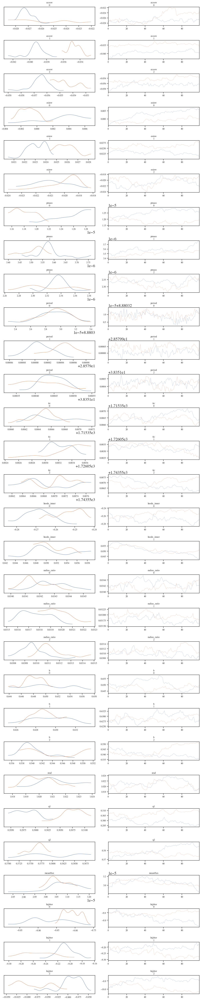

In [46]:
fig = az.plot_trace(mcmc, var_names=keys_ttv+['lnode_inner']+keys_transit+keys_gp, compact=False)
plt.tight_layout(pad=0.2)

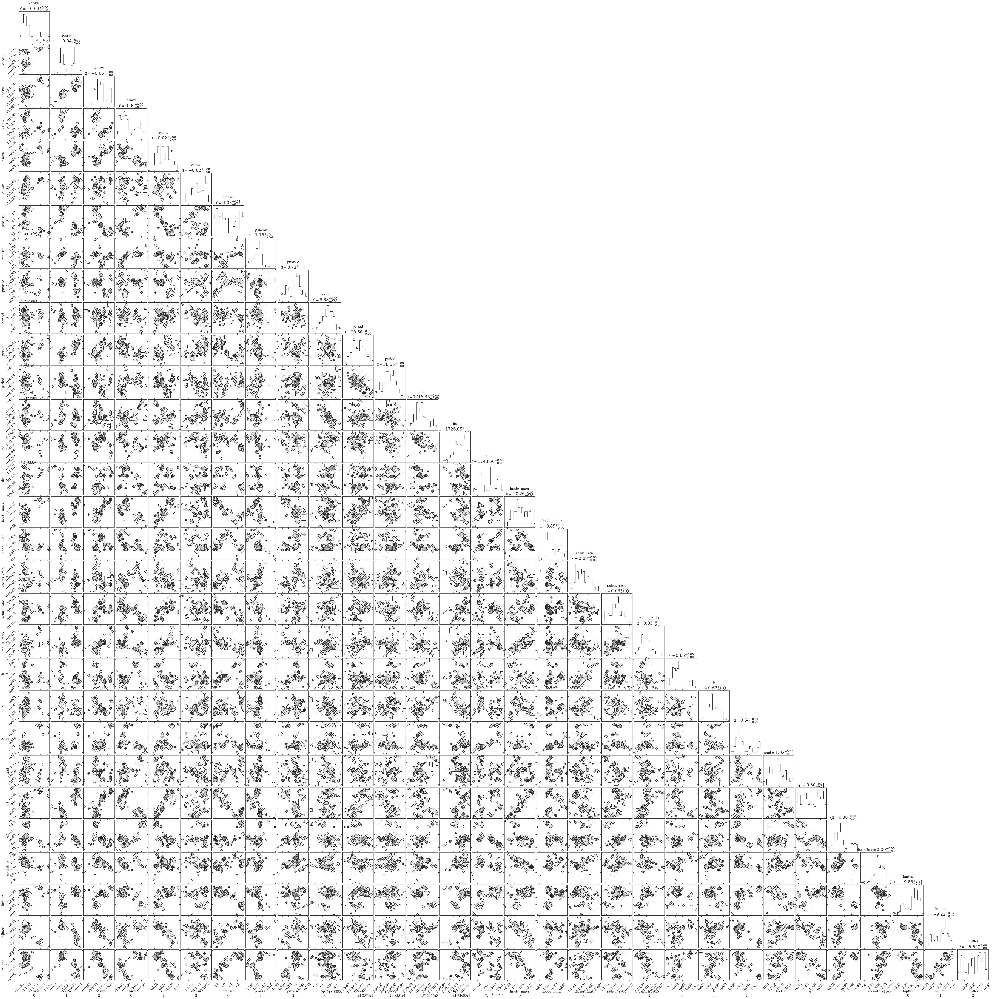

In [47]:
import corner
idata.posterior['pmasse'] = idata.posterior['pmass'] / 3.003e-6
keys_ttv_ = [key if key!="pmass" else "pmasse" for key in keys_ttv]
fig = corner.corner(idata, var_names=keys_ttv_+['lnode_inner']+keys_transit+keys_gp, show_titles=True)

In [50]:
samples = mcmc.get_samples()
fmodels = samples['fluxmodel'] + samples['meanflux'][:,None]
mu_phys = np.mean(samples['fluxmodel'] + samples['meanflux'][:,None], axis=0)
mu, sigma = np.mean(fmodels, axis=0), np.std(fmodels, axis=0)

/var/folders/69/wlx91x8s1x34mphlfjy0h4pm0000gn/T/ipykernel_65688/1478377552.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


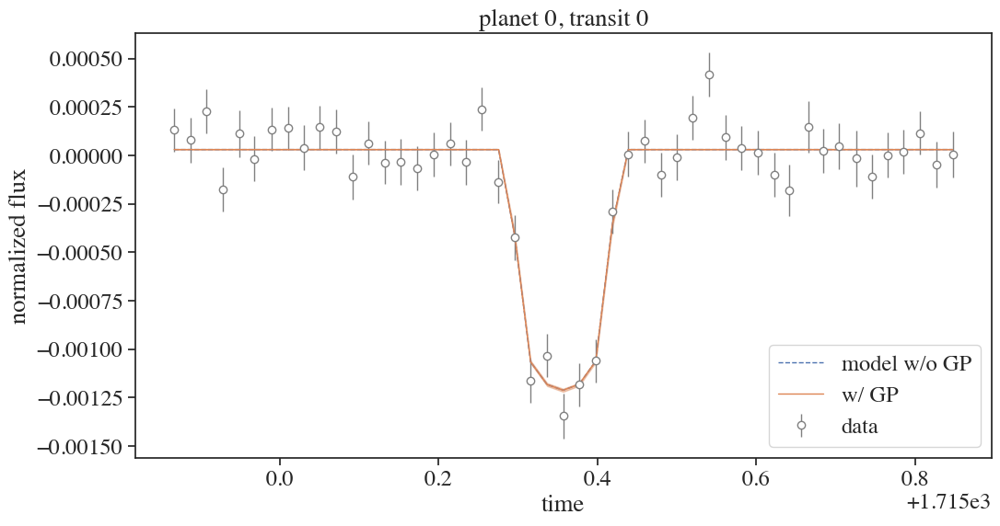

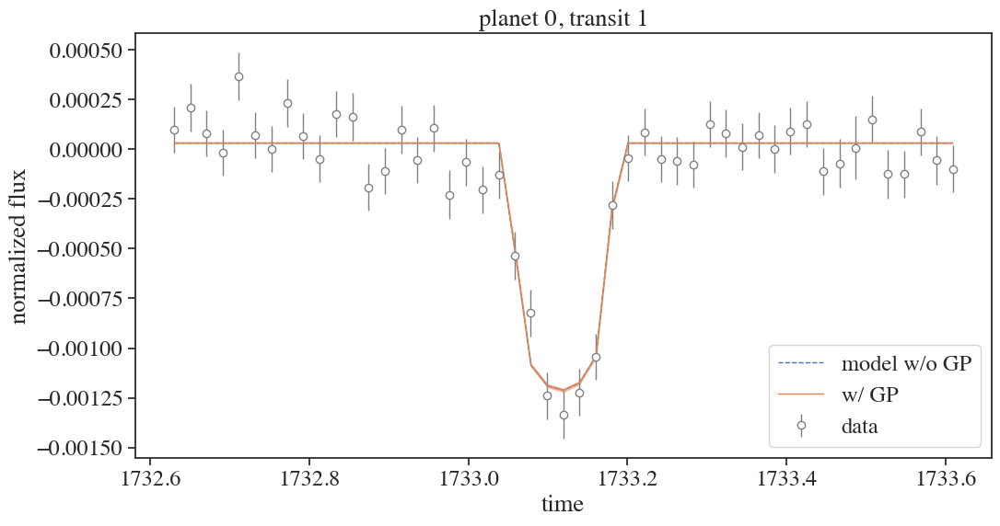

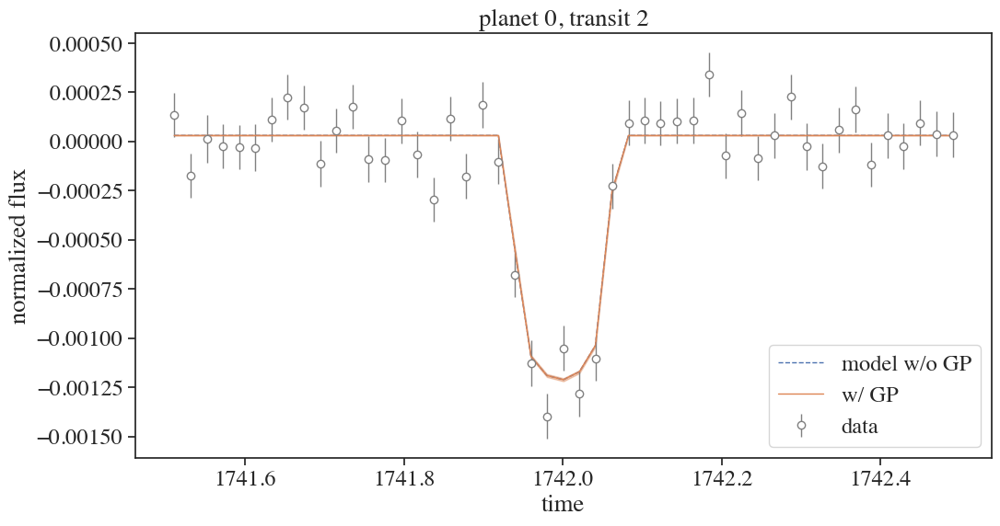

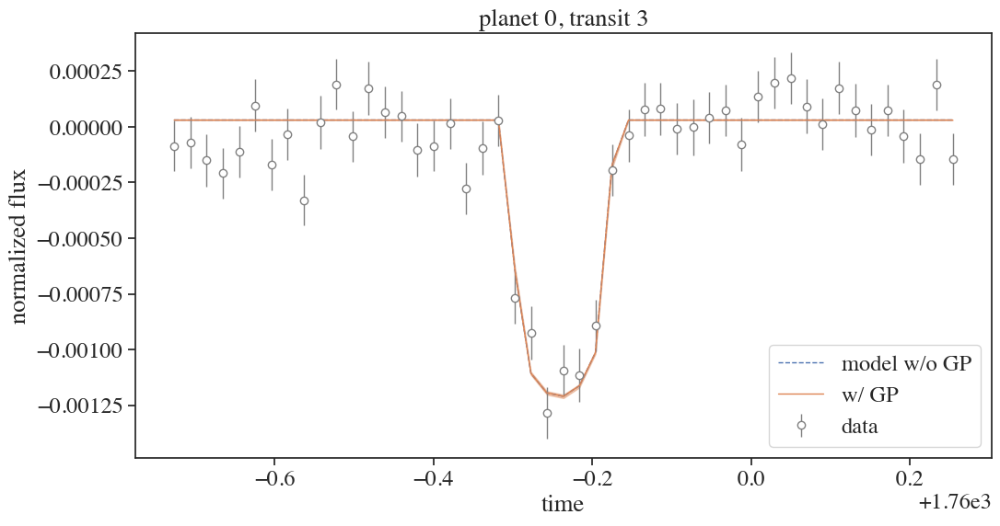

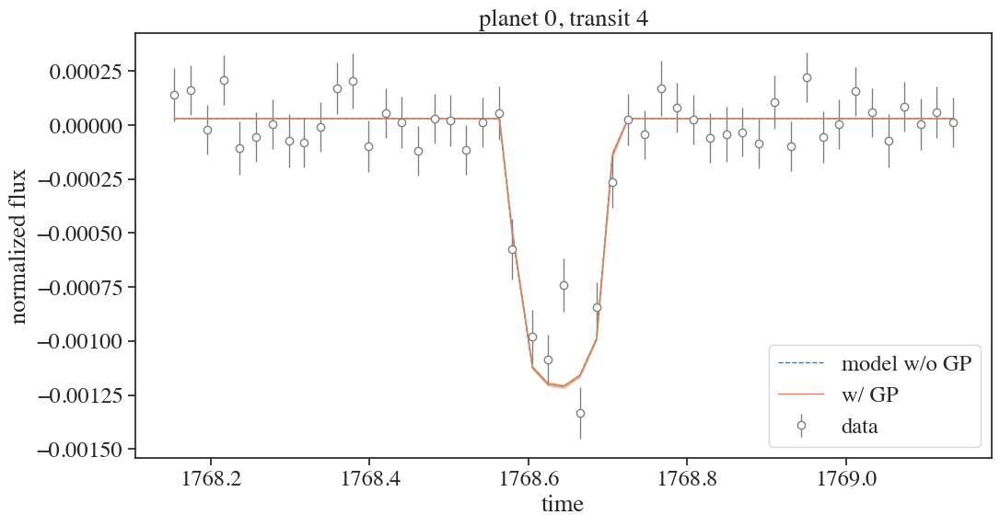

...

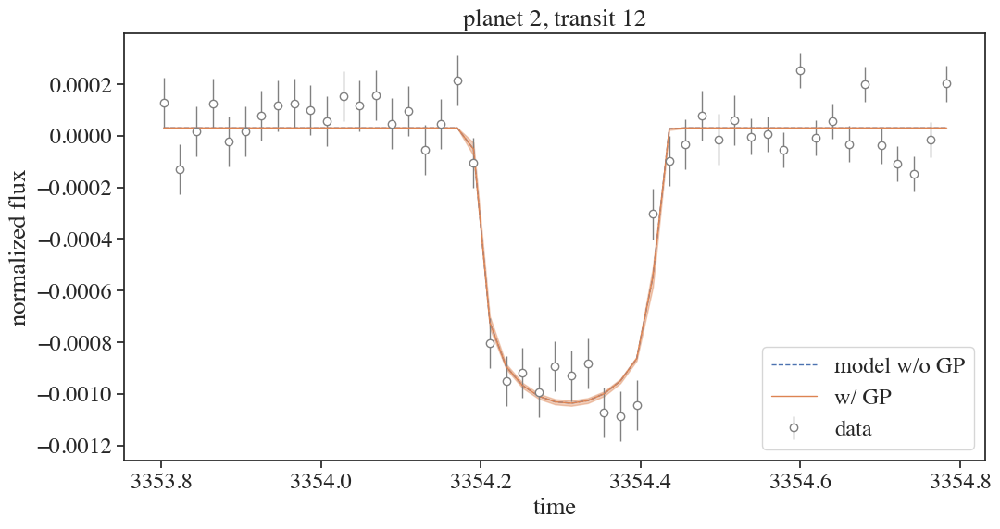

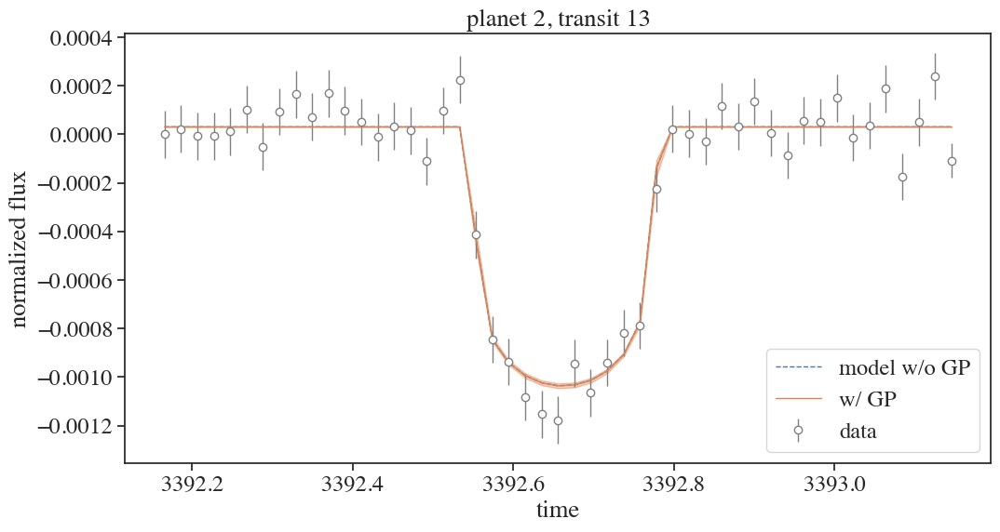

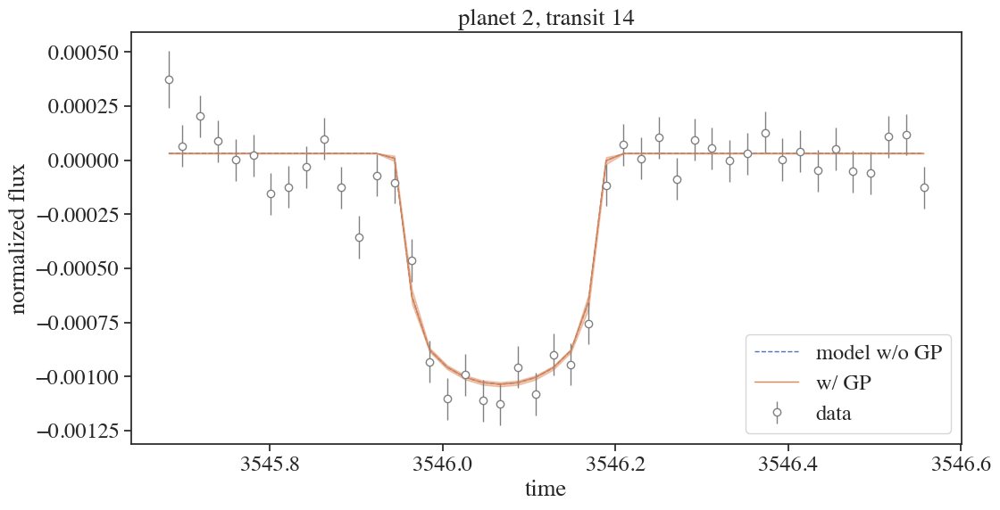

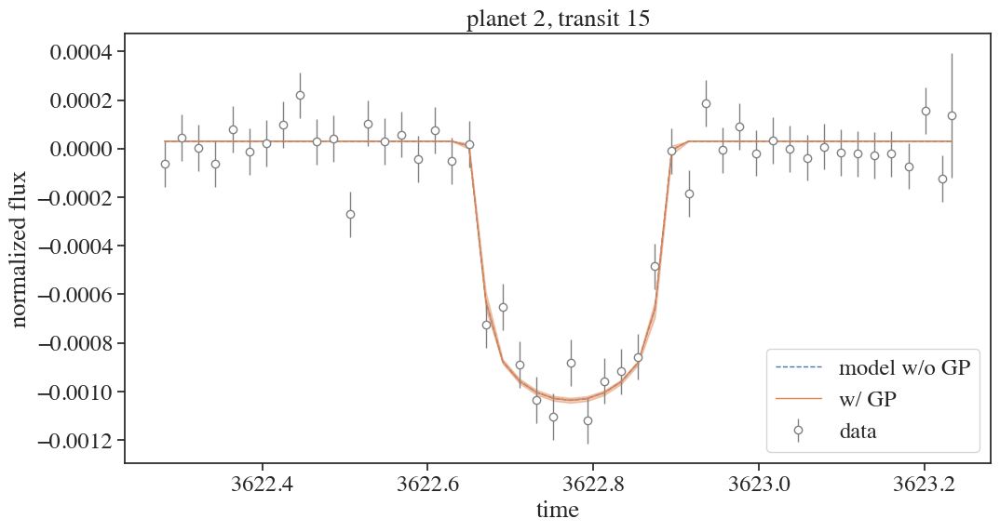

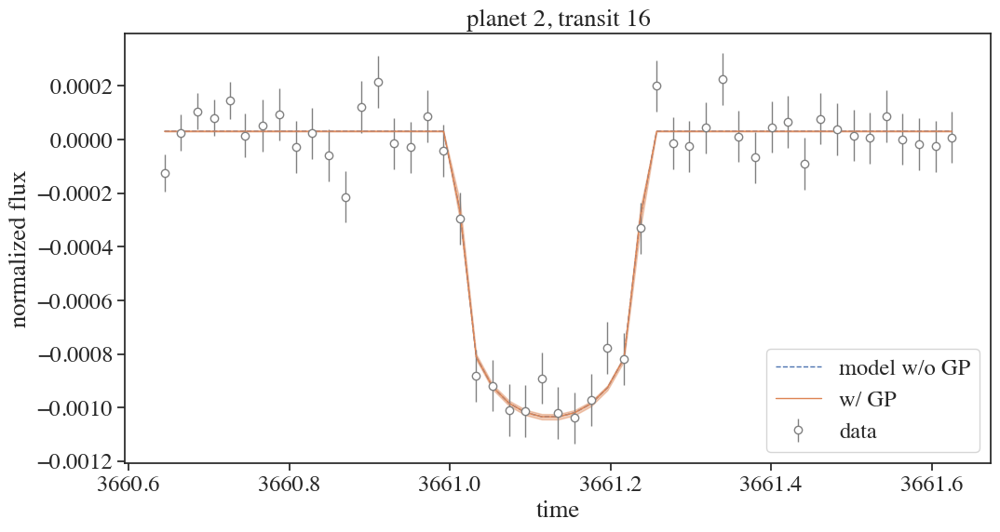

In [51]:
for j in range(3):
    tcs = nt.tcobs[j]
    for k,tc in enumerate(tcs):
        idx = np.abs(time_obs - tc) < 0.5
        plt.figure()
        plt.xlabel("time")
        plt.ylabel("normalized flux")
        plt.title("planet %d, transit %d"%(j,k))
        plt.errorbar(time_obs[idx], flux_obs[idx], yerr=error_obs[idx], fmt='o', lw=1, mfc='white', color='gray', label='data')
        idx = np.abs(time_obs - tc) < 0.5
        plt.plot(time_obs[idx], mu_phys[idx], '--', lw=1, color='C0', label='model w/o GP')
        plt.plot(time_obs[idx], mu[idx], '-', lw=1, color='C1', label='w/ GP')
        plt.fill_between(time_obs[idx], (mu-sigma)[idx], (mu+sigma)[idx], alpha=0.4, color='C1')
        plt.legend(loc='lower right')

In [21]:
from numpyro.infer import MCMC, NUTS
kernel = NUTS(model_full, 
              dense_mass=True, 
              init_strategy=init_to_value(values=popt_full), 
              target_accept_prob=0.95,
              max_tree_depth=11)

In [22]:
mcmc = MCMC(kernel, num_warmup=50, num_samples=150, num_chains=num_chains)

In [23]:
from jax import random
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, param_bounds_ttv, param_bounds_transit, extra_fields=('potential_energy', 'num_steps', 'adapt_state'), progress_bar=True)

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
mcmc.print_summary()

In [ ]:
# save output
import dill
with open("toi1339_photodynamics_gp_mcmc.pkl", "wb") as f:
    dill.dump(mcmc, f)